## Imports and Preparing Dataset Class

In [1]:
import sys
sys.path.append("../")

from cv_expt.base.data.base_dataset import ImageDataset, ImageDataType
from cv_expt.base.defs.defs import ImageChannel, DataType
from cv_expt.base.logger.base_logger import BaseLogger, BaseLoggerConfig
from cv_expt.base.configs.configs import TrainerConfig, DataConfig
from cv_expt.vis.visualization import subplot_images
from cv_expt.base.logger.base_logger import BaseLogger
from cv_expt.base.models.base_model import ModelWrapper
from cv_expt.base.trainer.base_trainer import Trainer
from cv_expt.utils.histogram import hist_eq, my_hist
from cv_expt.vis.visualization import subplot_images

from pathlib import Path
from typing import Optional
import torch
import cv2
import numpy as np
from tqdm import tqdm  # for progress bar
from torch import nn
from torch.optim import Optimizer
import segmentation_models_pytorch as smp
import datetime

class HistEqImageDataset(ImageDataset):    
    def _apply_hist_eq(self, img):
        rcbr = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
        rcbr[:, :, 0] = hist_eq(rcbr[:, :, 0])
        return cv2.cvtColor(rcbr, cv2.COLOR_YCrCb2RGB)
        # yuv = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
        # yuv[:, :, 0] = cv2.equalizeHist(yuv[:, :, 0])
        # return cv2.cvtColor(yuv, cv2.COLOR_YUV2RGB)
    
      
    def __getitem__(self, idx):        
        if self.config.samples_per_epoch != -1 and idx == len(self)-1:
            self.random_state.shuffle(self.data)
        
        inp = self.get_item(idx)

        if self.config.label_path:
            target = self.get_label(idx)
        else:
            target = inp.copy()

        image = inp
        label = self._apply_hist_eq(target)

        image = cv2.resize(image, self.input_size)
        label = cv2.resize(label, self.input_size)

        if self.transforms:
            image = self.transforms(image)
            label = self.transforms(label)

        if self.normalization:
            image = self.normalization(image)
            label = self.normalization(label)

        # if return_type is tensor, convert the image to tensor
        if self.return_type == ImageDataType.TENSOR:
            image = torch.tensor(image, dtype=torch.float32).permute(2, 0, 1)
            # because the image is grayscale, we need to add the channel dimension
            label = torch.tensor(label, dtype=torch.float32).permute(2, 0, 1)

        return image, label

def normalization(x):
    return x / 255.0

def denormalization(x):
    return x * 255.0

# random seed should be same for both
data_config = DataConfig(
    data_path=Path("../data/coco2017"),
    image_channels=ImageChannel.RGB,
    image_extensions=["jpg", "png"],
    max_data=-1,
    samples_per_epoch=1000,
)
val_data_config = DataConfig(
    data_path=Path("../data/coco2017"),
    image_channels=ImageChannel.RGB,
    image_extensions=["jpg", "png"],
    max_data=-1,
    samples_per_epoch=100,
)
train_dataset = HistEqImageDataset(
    data_config,
    return_type=ImageDataType.TENSOR,
    normalization=normalization,
    denormalization=denormalization,
)
# data_config.samples_per_epoch = 100
val_dataset = HistEqImageDataset(
    val_data_config,
    data_type=DataType.VALIDATION,
    return_type=ImageDataType.TENSOR,
    normalization=normalization,
    denormalization=denormalization,
)


/home/blackphoenix/projects/computer-vision-experiments/venv/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
INFO:albumentations.check_version:A new version of Albumentations is available: 1.4.14 (you have 1.4.13). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.


Data type: DataType.TRAIN, Number of images: 131165, Data Length: 1000
Data type: DataType.VALIDATION, Number of images: 32792, Data Length: 100


### Sample Images

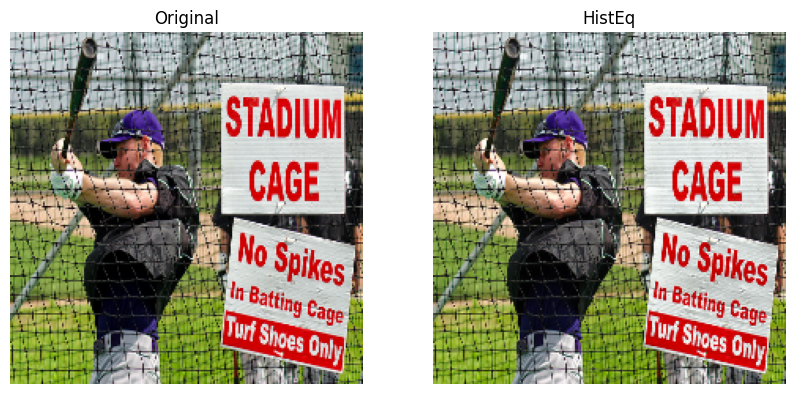

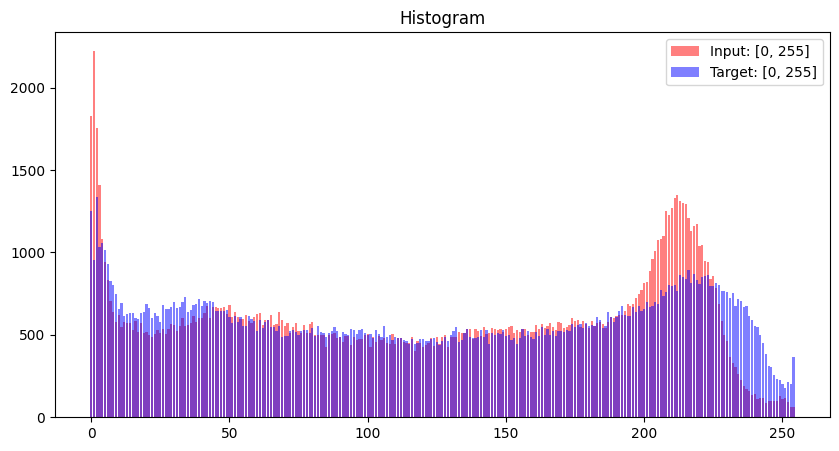

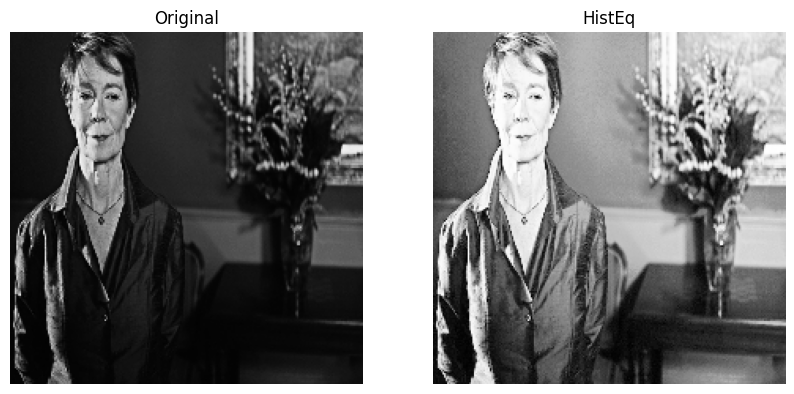

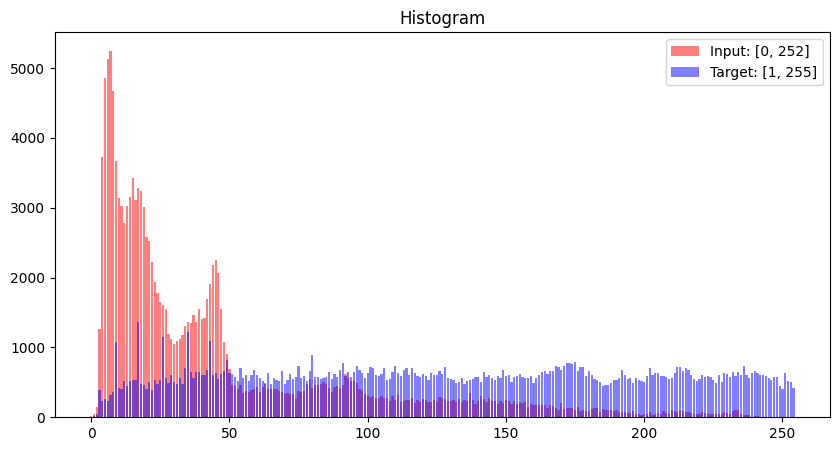

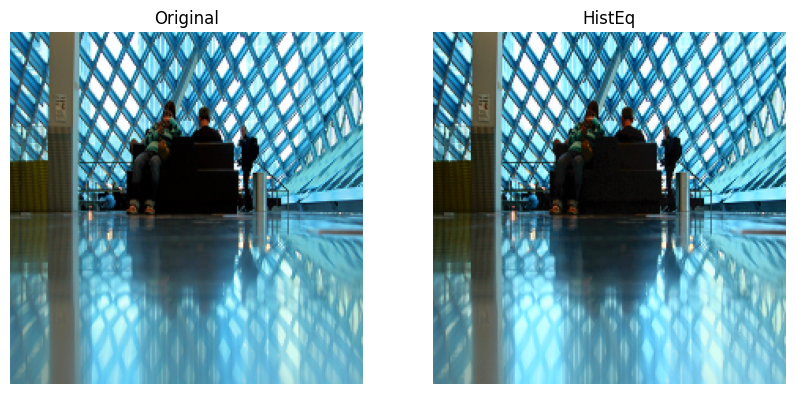

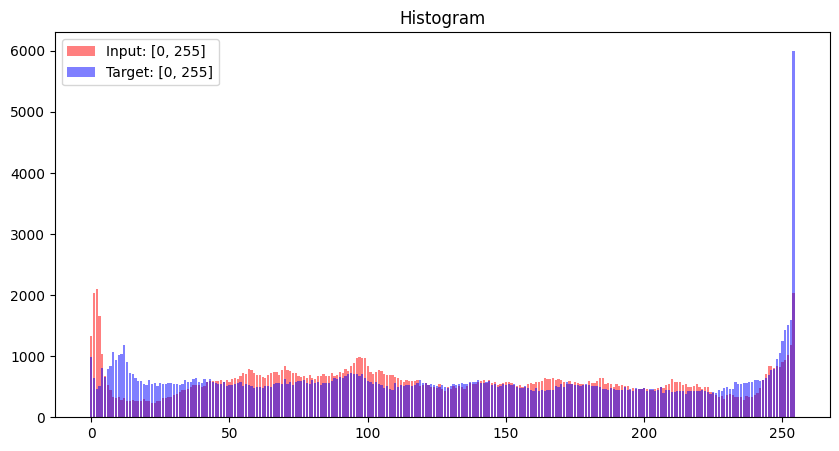

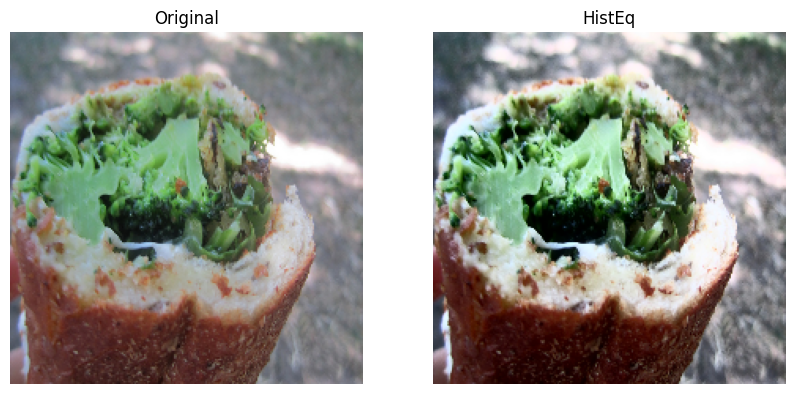

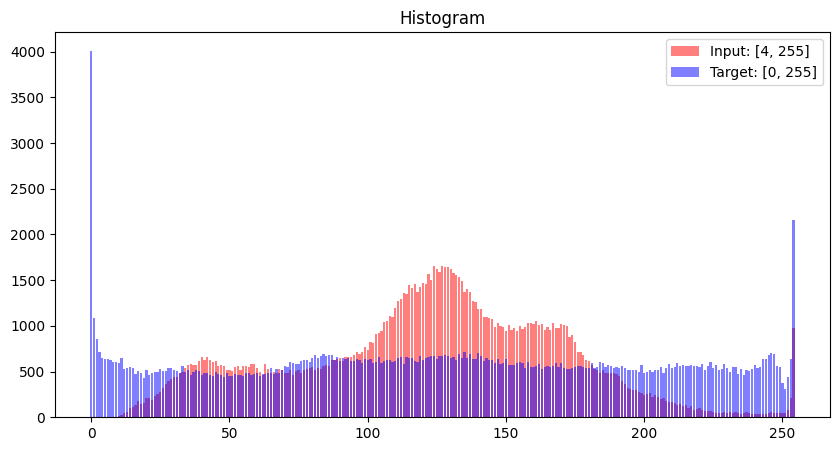

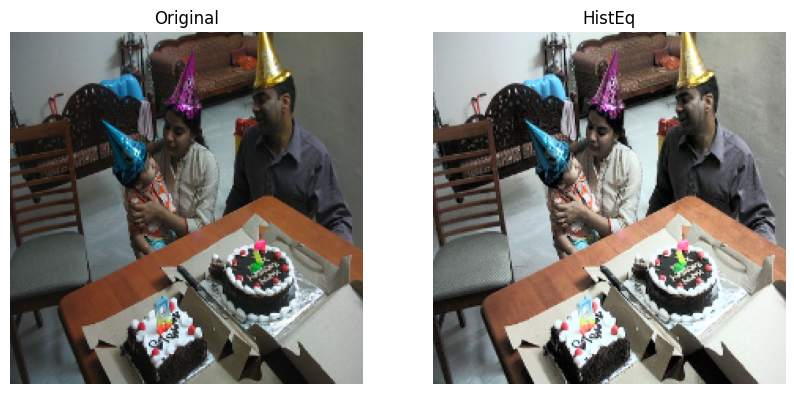

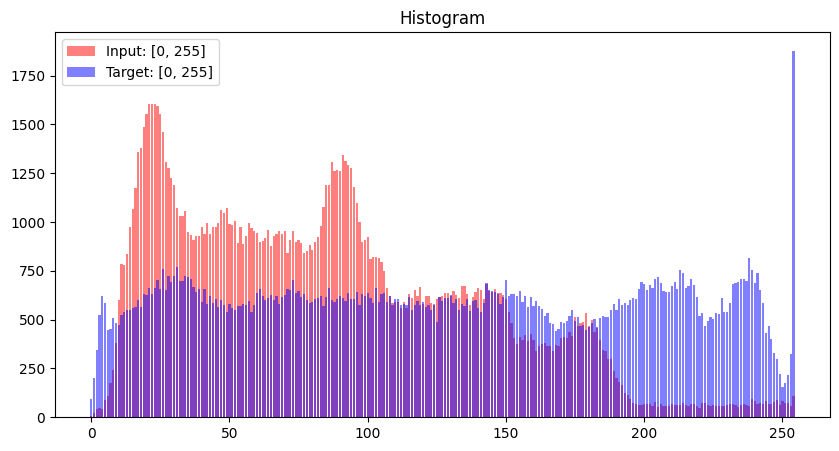

In [2]:
import matplotlib.pyplot as plt

for i in np.random.randint(0, len(train_dataset), 5):
    inp, target = denormalization(train_dataset[i][0].permute(1,2,0).numpy()).astype(np.uint8),denormalization(train_dataset[i][1].permute(1,2,0).numpy()).astype(np.uint8)
    subplot_images([inp,target], ["Original", "HistEq"], order = (-1,2))
    
    hist_inp = my_hist(inp, 255)
    hist_target = my_hist(target, 255)
    # print(sum(hist_orig), sum(hist_pred))
    omax, omin = inp.max(), inp.min()
    pmax, pmin = target.max(), target.min()
    fig = plt.figure(figsize=(10, 5))
    plt.bar(np.arange(len(hist_inp)), hist_inp,  color='r', alpha=0.5, label=f'Input: [{omin}, {omax}]')
    plt.bar(np.arange(len(hist_target)), hist_target, color='b', alpha=0.5, label=f'Target: [{pmin}, {pmax}]')
    plt.legend()
    plt.title("Histogram")
    plt.show()

## Model and Training

In [3]:
class CustomTrainer(Trainer):
    def visualize_output(self, sample, inputs, outputs, targets):
        images = []
        titles = []
                                    
        for _, (inp, output, target) in enumerate(
            zip(inputs, outputs, targets)
        ):
            if sample == self.config.display_samples_per_epoch:
                break

            inp = self.model.postprocess_output(inp).astype(np.uint8)
            output = self.model.postprocess_output(output).astype(np.uint8)
            target = self.model.postprocess_output(target).astype(np.uint8)
            images.extend(
                [
                    inp,
                    target,
                    output,
                ]
            )
            titles.extend(["Input", "Target", "Output"])
    
            sample += 1
        return images, titles, sample

config = TrainerConfig(
    result_dir=Path("../results"),
    expt_name="hist_eq",
    run_name=f"run_{datetime.datetime.now().date()}",
    epochs=100,
    show_images=True,
    batch_size=32,
    
)
model = smp.Unet("resnet18", classes=3, in_channels=3, activation="sigmoid")
model = ModelWrapper(
    model,
    postprocess=val_dataset.denormalization,
    preprocess=val_dataset.normalization,
)

optimizer = torch.optim.Adam(model.parameters())
criterion = nn.MSELoss()
trainer = CustomTrainer(
    model,
    config,
    optimizer,
    criterion,
    BaseLogger(BaseLoggerConfig(log_path=config.run_dir, name='hist_eq', log_in_console=False)),
    train_dataset,
    val_dataset,
)

Val Epoch 0:  25%|██▌       | 1/4 [00:00<00:01,  1.52it/s, val_loss=0.0215]

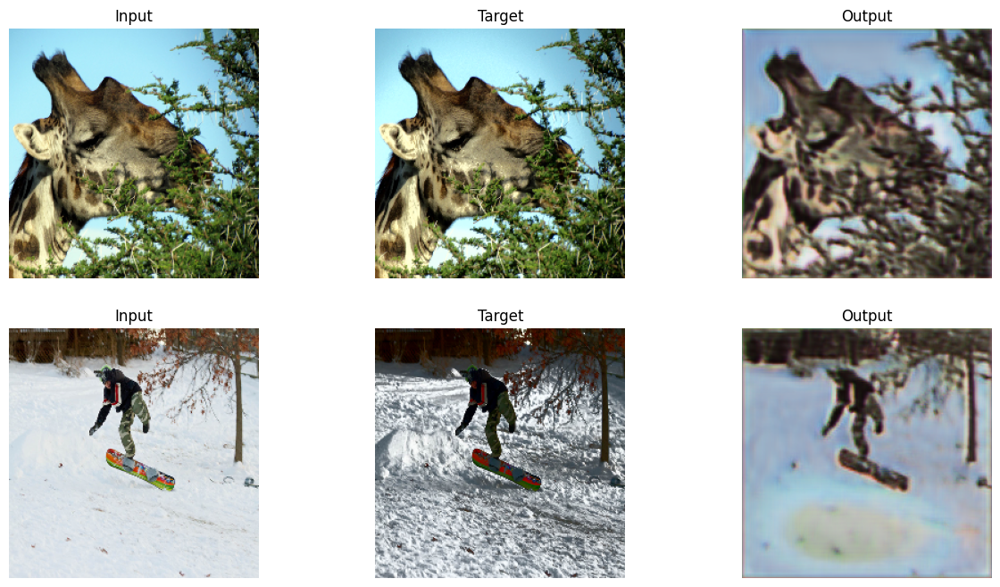

Val Epoch 10:  25%|██▌       | 1/4 [00:00<00:02,  1.47it/s, val_loss=0.00959]

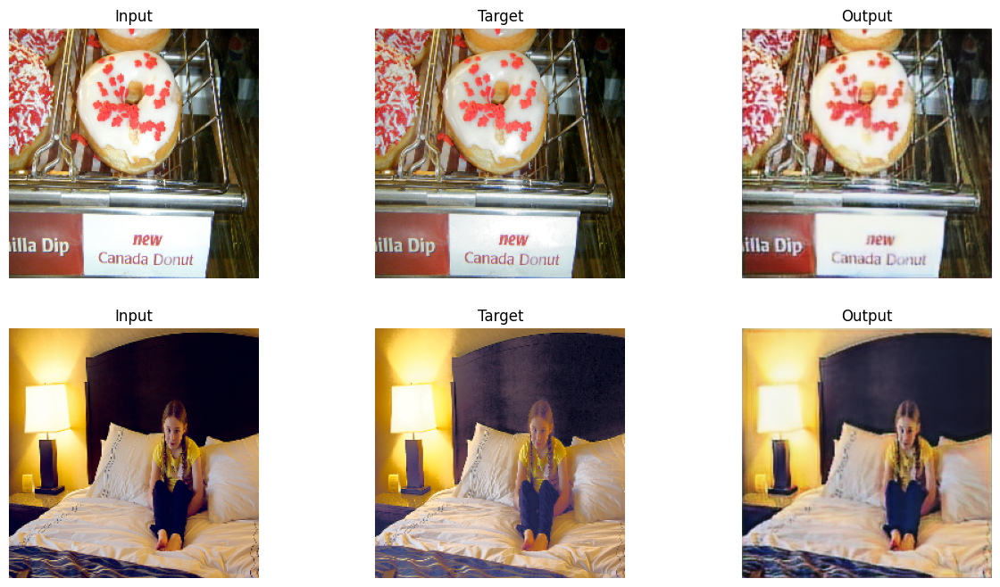

Val Epoch 20:  25%|██▌       | 1/4 [00:00<00:02,  1.34it/s, val_loss=0.00553]

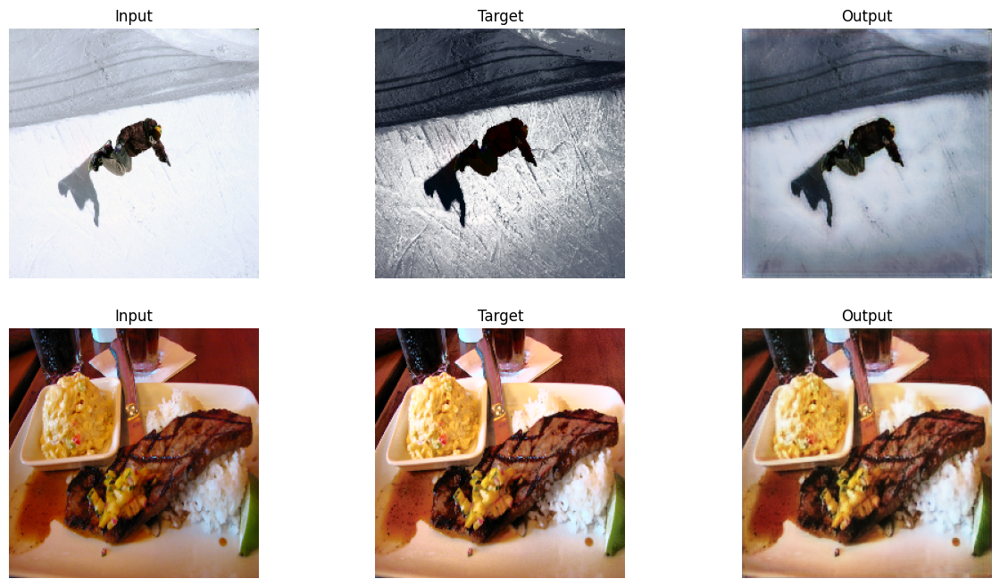

Val Epoch 30:  25%|██▌       | 1/4 [00:00<00:02,  1.43it/s, val_loss=0.00656]

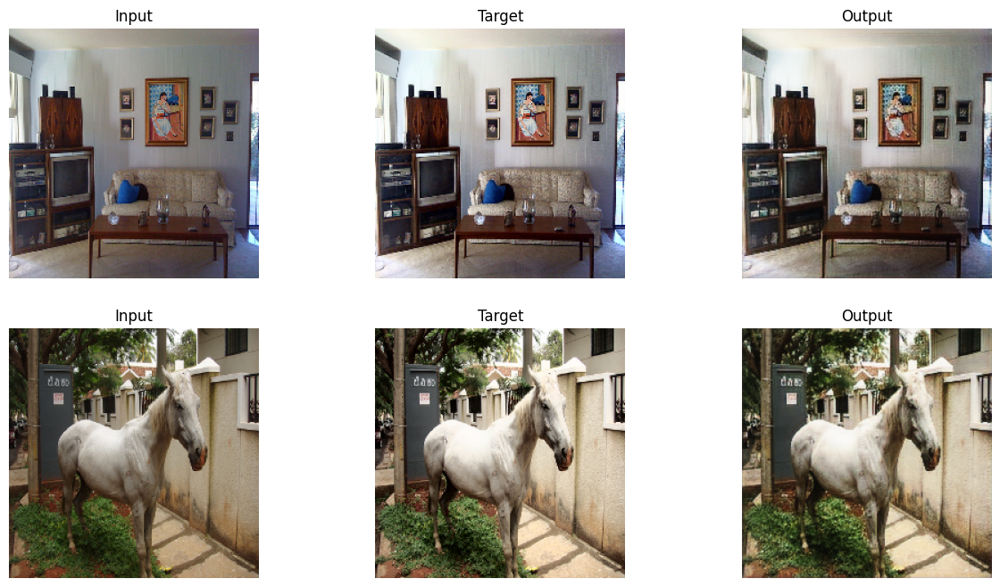

Val Epoch 40:  25%|██▌       | 1/4 [00:00<00:02,  1.45it/s, val_loss=0.00432]

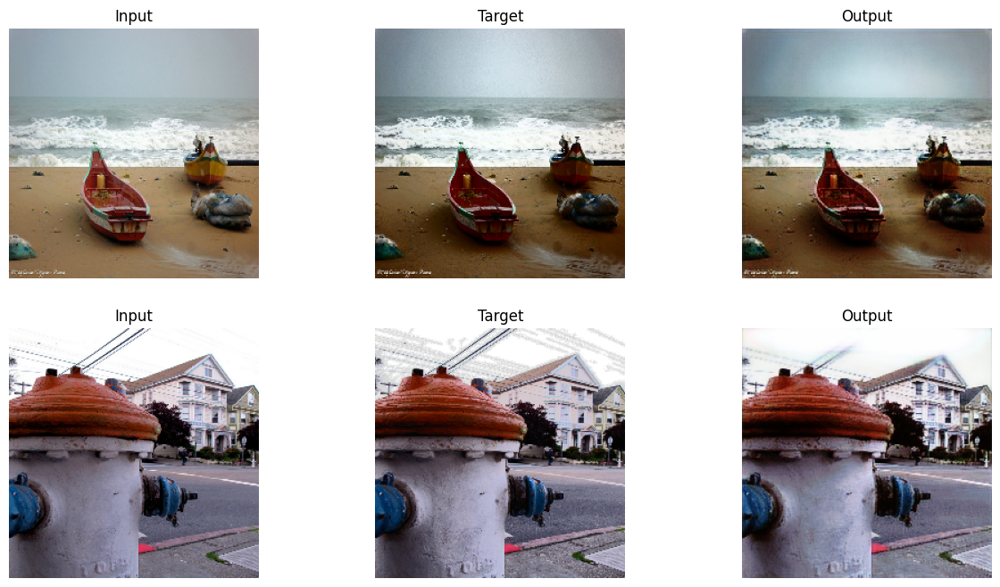

Val Epoch 50:  25%|██▌       | 1/4 [00:00<00:02,  1.30it/s, val_loss=0.00395]

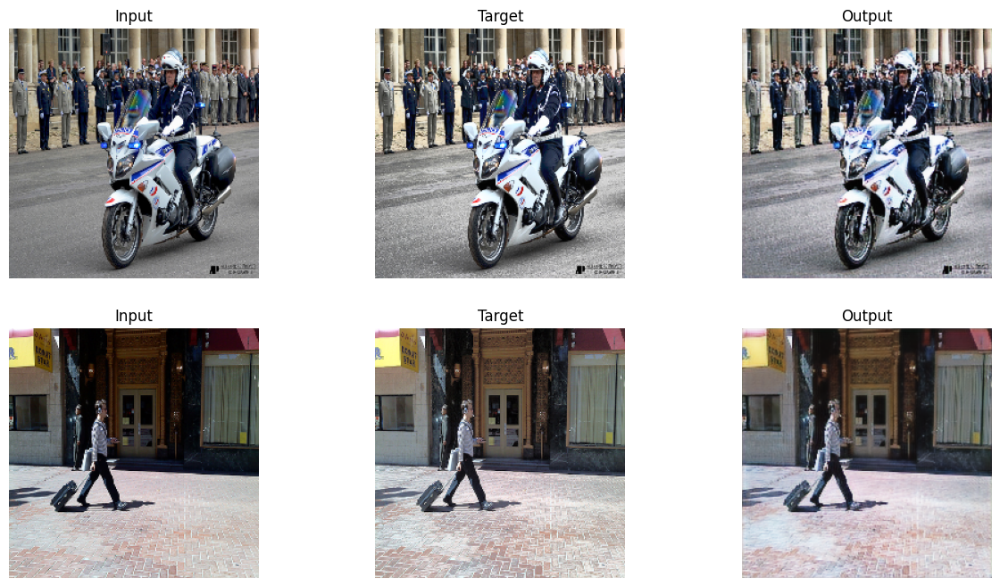

Val Epoch 60:  25%|██▌       | 1/4 [00:00<00:02,  1.48it/s, val_loss=0.0045]

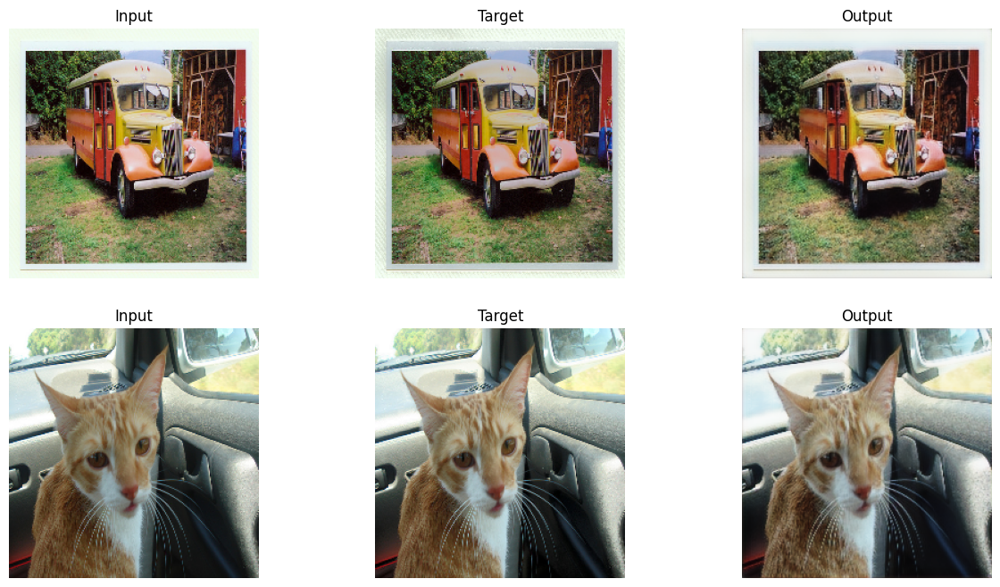

Val Epoch 70:  25%|██▌       | 1/4 [00:00<00:02,  1.33it/s, val_loss=0.00381]

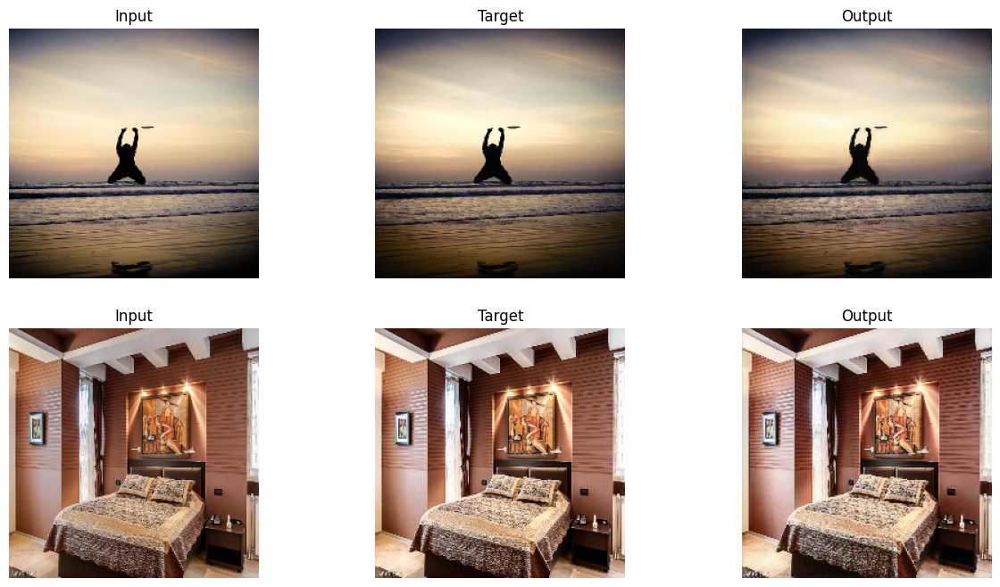

Val Epoch 80:  25%|██▌       | 1/4 [00:00<00:02,  1.33it/s, val_loss=0.00484]

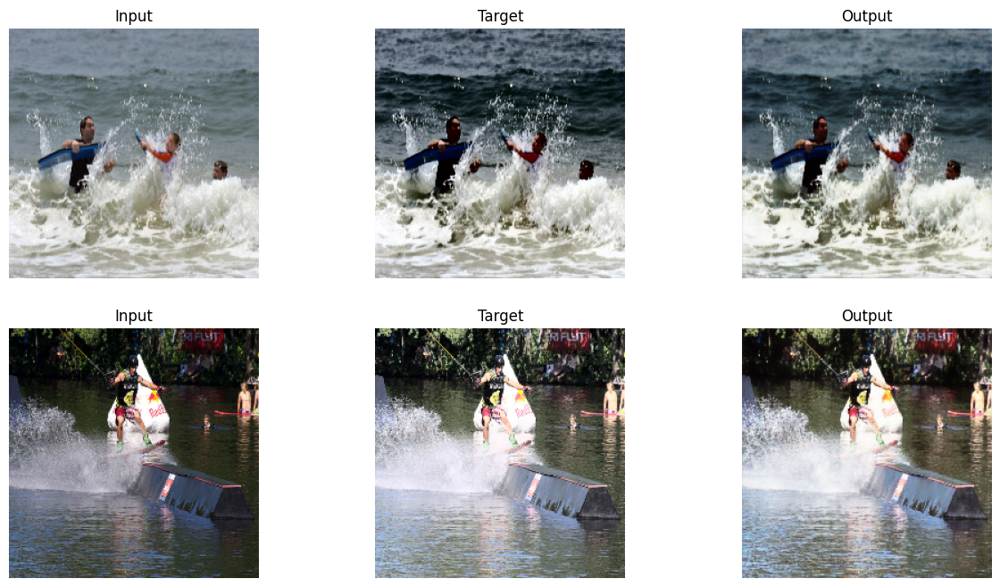

Val Epoch 90:  25%|██▌       | 1/4 [00:00<00:02,  1.39it/s, val_loss=0.00354]

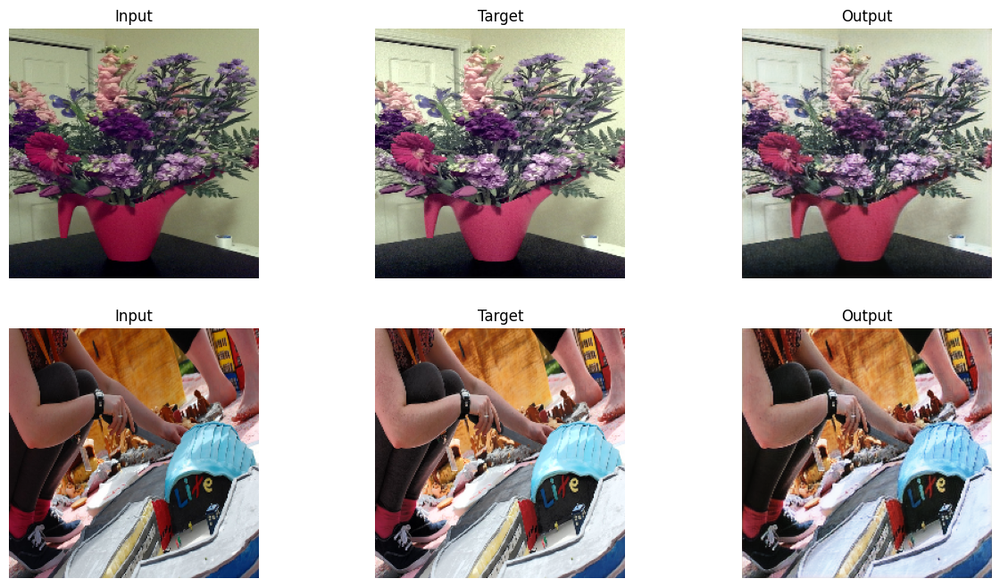

Val Epoch 99: 100%|██████████| 4/4 [00:02<00:00,  1.71it/s, val_loss=0.00352]


In [4]:
trainer.train()

In [5]:
trainer.best_model_path

PosixPath('../results/hist_eq/run_2024-08-30/models/best_model.pth')

/tmp/ipykernel_13283/2872046509.py:4: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  loaded_model = torch.load(str(trainer.best_model_path))


254 0


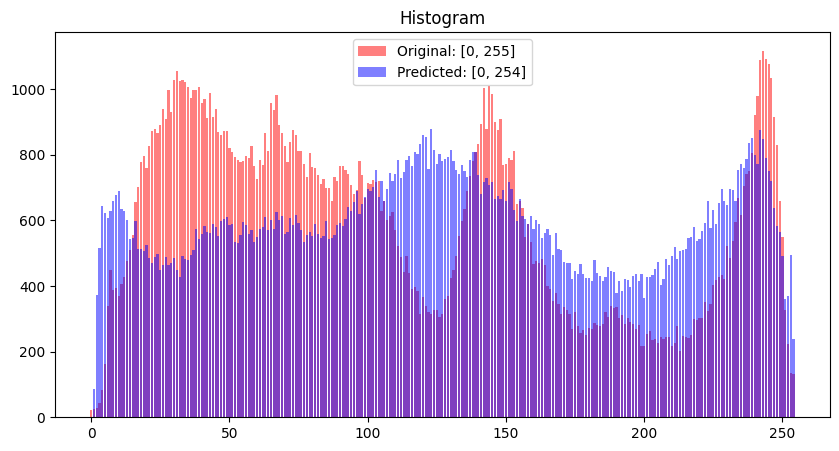

254 5


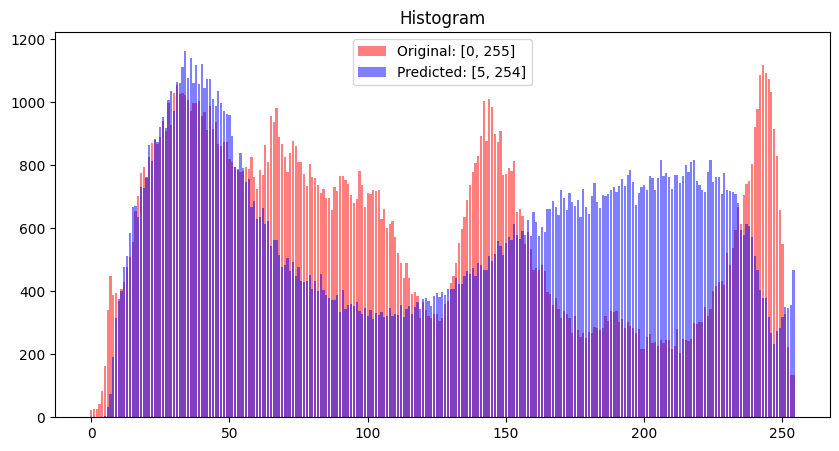

254 2


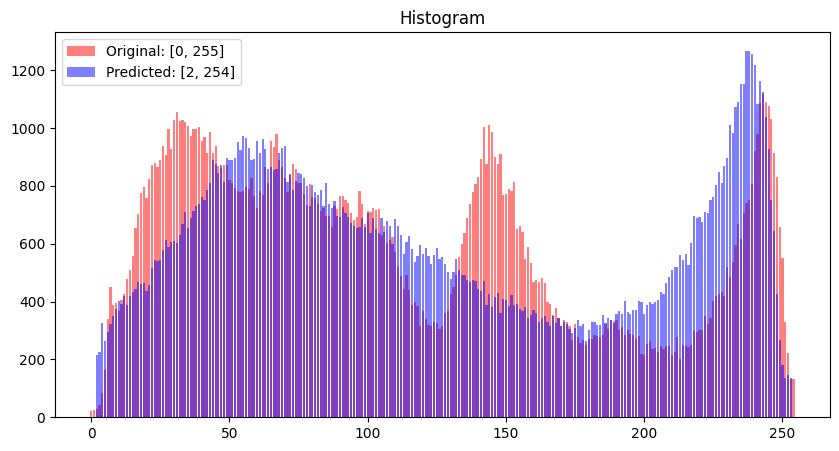

254 2


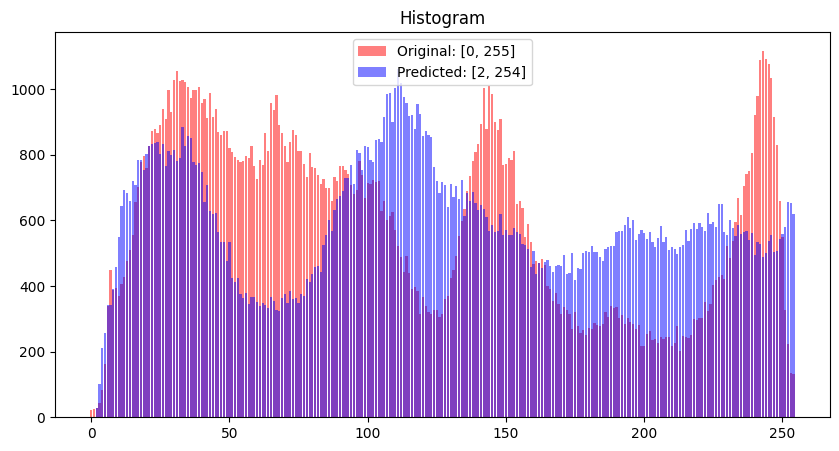

254 0


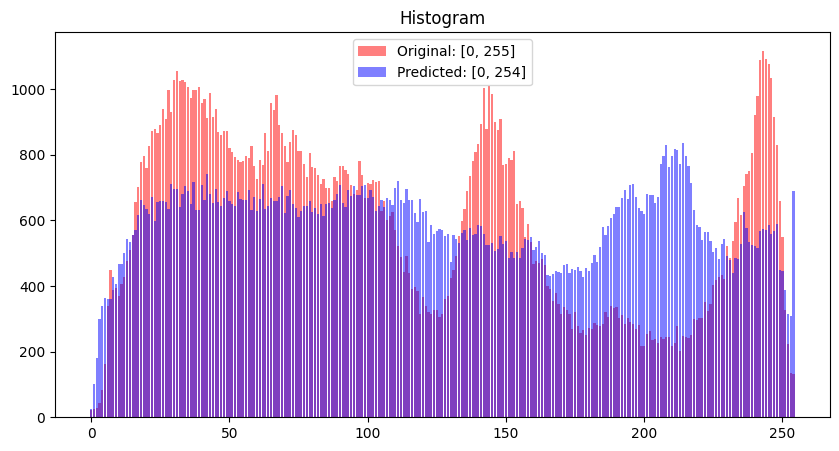

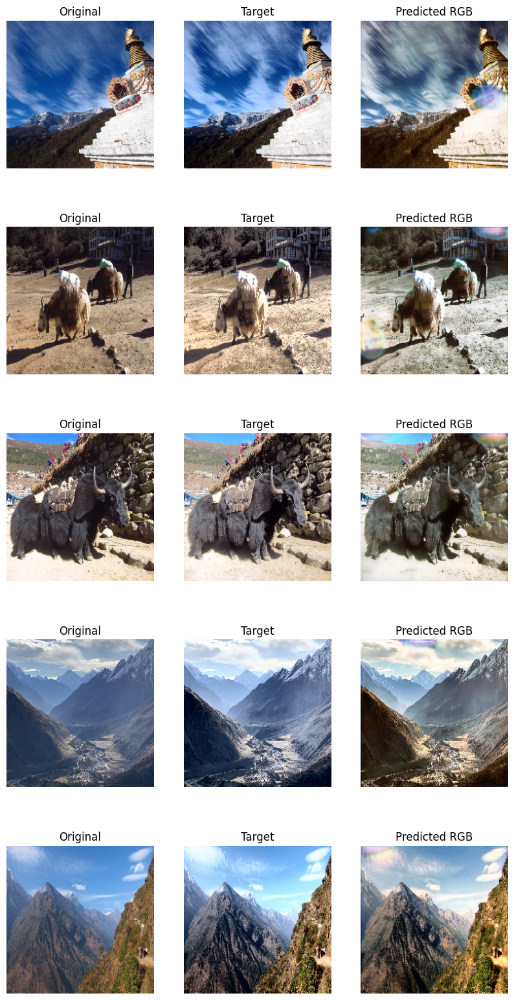

: 

In [6]:
from cv_expt.utils.histogram import plot_hist
import matplotlib.pyplot as plt

loaded_model = torch.load(str(trainer.best_model_path))
test_root = Path("../data/test_images")
# test_root = Path("../data/coco2017/train2017")
images = []
titles=[]
max_data = 5
for i, test_img in enumerate(test_root.iterdir()):
    if i >= max_data:
        break
    rgb_img = cv2.imread(str(test_img))
    rgb_img = cv2.cvtColor(rgb_img, cv2.COLOR_BGR2RGB)
    
    rgb_img = cv2.resize(rgb_img, data_config.input_size[::-1])
    ycbr = cv2.cvtColor(rgb_img, cv2.COLOR_RGB2YCrCb)
    ycbr[:, :, 0] = hist_eq(ycbr[:, :, 0])
    heq_img = cv2.cvtColor(ycbr, cv2.COLOR_YCrCb2RGB)
    
    images.append(cv2.resize(rgb_img, data_config.input_size[::-1]))
    images.append(heq_img)
    img = rgb_img / 255.0
    img = torch.tensor(img, dtype=torch.float32).permute(2,0,1).unsqueeze(0)
    # print(img.shape)
    pred = loaded_model(img.cuda())
    # print(pred.shape)
    pred = pred.squeeze(0)#.squeeze(0)
    pred = pred.detach().cpu().permute(1, 2, 0).numpy()
    
    pred = (denormalization(pred)).astype(np.uint8)
    images.append(pred)
    print(pred.max(), pred.min())
    titles.extend(["Original", "Target", "Predicted RGB"])
    hist_orig = my_hist(images[0], 255)
    hist_pred = my_hist(pred, 255)
    # print(sum(hist_orig), sum(hist_pred))
    omax, omin = images[0].max(), images[0].min()
    pmax, pmin = pred.max(), pred.min()
    fig = plt.figure(figsize=(10, 5))
    plt.bar(np.arange(len(hist_orig)), hist_orig,  color='r', alpha=0.5, label=f'Original: [{omin}, {omax}]')
    plt.bar(np.arange(len(hist_pred)), hist_pred, color='b', alpha=0.5, label=f'Predicted: [{pmin}, {pmax}]')
    plt.legend()
    plt.title("Histogram")
    plt.show()
    # break

from cv_expt.vis.visualization import subplot_images
subplot_images(images, order=(-1, 3), titles=titles, fig_size=(10, 20)).savefig(str(trainer.images_dir/"test_images.png"))